In [1]:
import matplotlib.pyplot as plt
import numpy as np
import numpy.fft as fft
import cv2
from numpy import random
import math
from PIL import Image
from math import ceil
from math import sqrt
from math import cos
from math import sin
import scipy.stats as st
from matplotlib.pyplot import figure

### 1(a) PROBLEM-1

#### 1. Form an image "A" of dimension 16x16 containing 16 vertical strips.

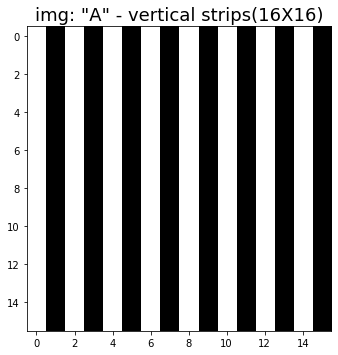

In [2]:
height=16
width=16
A = np.zeros((height,width), np.uint8)

for i in range (int(height)):
    for j in range (0,int(height),2):
        A[i,j]=255

# OUTPUT IMAGE
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(121)
plt.title('img: "A" - vertical strips(16X16)',fontsize=18)
plt.imshow(A,cmap='gray')

#### 2. Form a check-board "B" of dimension 16x16 containing 16 blocks

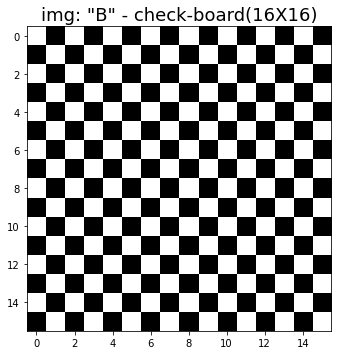

In [3]:
height=16
width=16
B = np.zeros((height,width), np.uint8)

for i in range (int(height)):
    for j in range (i%2,int(height),2):
        B[i,j]=255

# OUTPUT IMAGE
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(121)
plt.title('img: "B" - check-board(16X16)',fontsize=18)
plt.imshow(B,cmap='gray')

#### 3.Form an image "C" of dimension 64x64 containing top-left and bottom-right quarter parts A and top-right & bottomleft quarters B. 

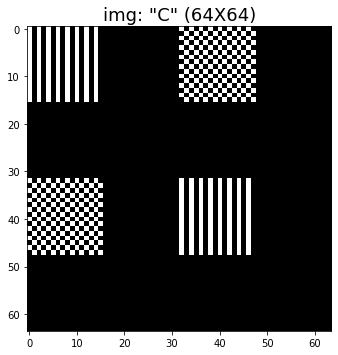

In [4]:
height=64
width=64
C = np.zeros((height,width), np.uint8)

for i in range (height//4):
    for j in range (width//4):
        C[i,j]=A[i,j]
        C[i,(width//2)+j]=B[i,j]
        C[(height//2)+i,j]=B[i,j]
        C[(height//2)+i,(width//2)+j]=A[i,j]
        
# OUTPUT IMAGE
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(121)
plt.title('img: "C" (64X64)',fontsize=18)
plt.imshow(C,cmap='gray')

### 1(a) PROBLEM-2

#### 1. Break the cameraman image "C" of dimension 256x256 into four equal square shapes C11, C12, C21 & C22 and display all into a single figure of 2x2 dimensions. 

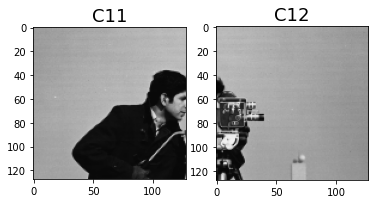

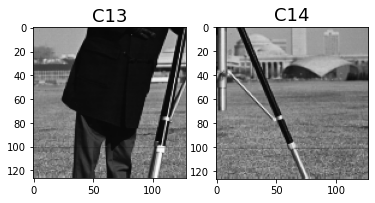

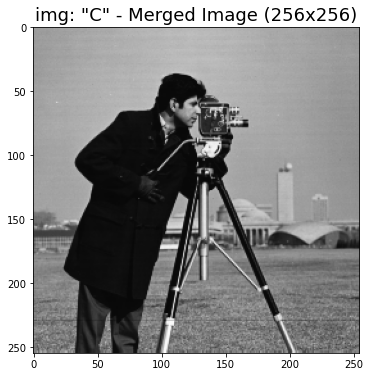

In [5]:
cameraman=cv2.imread("cameraman.png") #cameraman image

C11 = cameraman[0:128 , 0:128]
C12 = cameraman[0:128 , 129:256]
C21 = cameraman[129:256 , 0:128]
C22 = cameraman[129:256 , 129:256]

R1 = cv2.hconcat([C11, C12])
R2 = cv2.hconcat([C21, C22])
new_cameraman = cv2.vconcat([R1, R2])

# OUTPUT IMAGE
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(121)
plt.title('C11',fontsize=18)
plt.imshow(C11,cmap='gray')

ax = fig.add_subplot(122)
plt.title('C12',fontsize=18)
plt.imshow(C12,cmap='gray')

fig2 = plt.figure(figsize=(6,6))
ax2 = fig2.add_subplot(121)
plt.title('C13',fontsize=18)
plt.imshow(C21,cmap='gray')

ax2 = fig2.add_subplot(122)
plt.title('C14',fontsize=18)
plt.imshow(C22,cmap='gray')

fig3 = plt.figure(figsize=(12,6))
# ax3 = fig.add_subplot(121)
plt.title('img: "C" - Merged Image (256x256)',fontsize=18)
plt.imshow(new_cameraman,cmap='gray')

#### 2. Now interchange the C11 & C22 and C12 & C21 and show the image. 

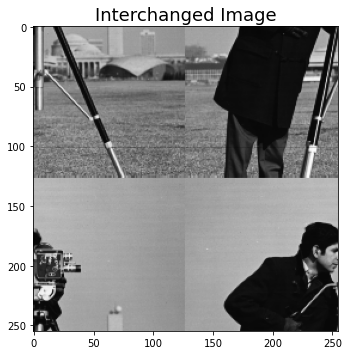

In [6]:
R1 = cv2.hconcat([C22, C21])
R2 = cv2.hconcat([C12, C11])
new_interchanged = cv2.vconcat([R1, R2])

# OUTPUT IMAGE
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(121)
plt.title('Interchanged Image',fontsize=18)
plt.imshow(new_interchanged,cmap='gray')

### 1(a) PROBLEM-3

#### 1. Form an image of vertical ramp having a ramp values from 0 to 255 and dimension 256x256.

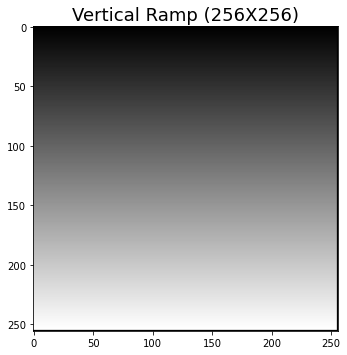

In [7]:
height=256
width=256
ramp = np.zeros((height,width), np.uint8)

for i in range (int(height)-1):
    for j in range (int(height)-1):
        ramp[i,j]=i

# OUTPUT IMAGE
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(121)
plt.title('Vertical Ramp (256X256)',fontsize=18)
plt.imshow(ramp,cmap='gray')

#### 2. Form an image of a circle of radius of 50 pixels and dimension 256x256. 

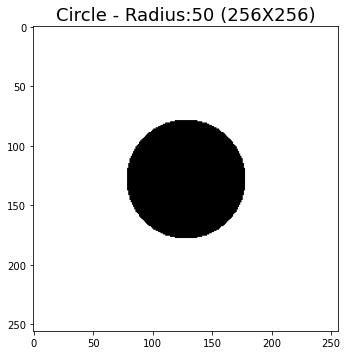

In [8]:
height=256
width=256
circle = np.zeros((height,width), np.uint8)
r=50

for i in range (height):
    for j in range (width):
        if np.sqrt((j-(height//2))*(j-(height//2))+(i-(width//2))*(i-(width//2)))<r:
            circle[i,j]=0
        else:
             circle[i,j]=255

# OUTPUT IMAGE
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(121)
plt.title('Circle - Radius:50 (256X256)',fontsize=18)
plt.imshow(circle,cmap='gray')

#### 3. Now superimpose the circle to cameraman image to get the circular part of cameraman image.

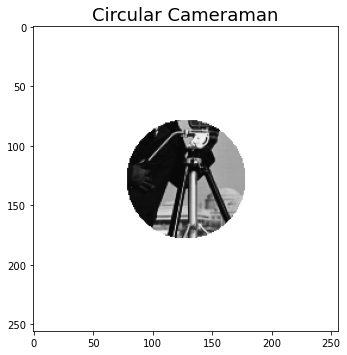

In [9]:
for i in range (height):
    for j in range (width):
        if circle[i,j]:
             cameraman[i,j]=255

# OUTPUT IMAGE
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(121)
plt.title('Circular Cameraman',fontsize=18)
plt.imshow(cameraman,cmap='gray')

#### 4. Form an image of a disc of Inner radius=50 pixels and outer radius=100 pixels. 

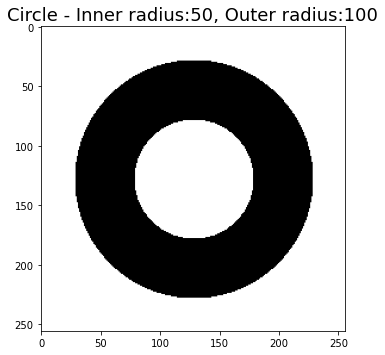

In [10]:
height=256
width=256
circle_2 = np.zeros((height,width), np.uint8)
o_r=100
i_r=50

for i in range (height):
    for j in range (width):
        if np.sqrt((j-(height//2))*(j-(height//2))+(i-(width//2))*(i-(width//2)))<i_r:
            circle_2[i,j]=255
        elif np.sqrt((j-(height//2))*(j-(height//2))+(i-(width//2))*(i-(width//2)))<o_r:
            circle_2[i,j]=0
        else:
             circle_2[i,j]=255

# OUTPUT IMAGE
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(121)
plt.title('Circle - Inner radius:50, Outer radius:100',fontsize=18)
plt.imshow(circle_2,cmap='gray')

### 1(b) PROBLEM-1

#### Generate a matrix A of dimension 512×512 with random integer values between 0 and 255 (using rand function in double datatype) and perform following operations over the generated image: 

#### a) Convert the matrix A into an image B. 

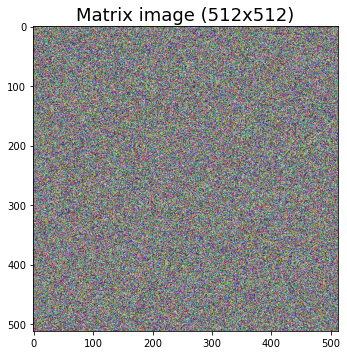

In [71]:
A = np.random.rand(512,512,3) # Matrix A
B = A[0:512,0:512] #Matrix A to image B

# OUTPUT IMAGE
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(121)
plt.title('Matrix image (512x512)',fontsize=18)
plt.imshow(B,cmap='gray')

#### b) Resize the image B in following dimensions: 100×120,600×512, 1024×1024. 

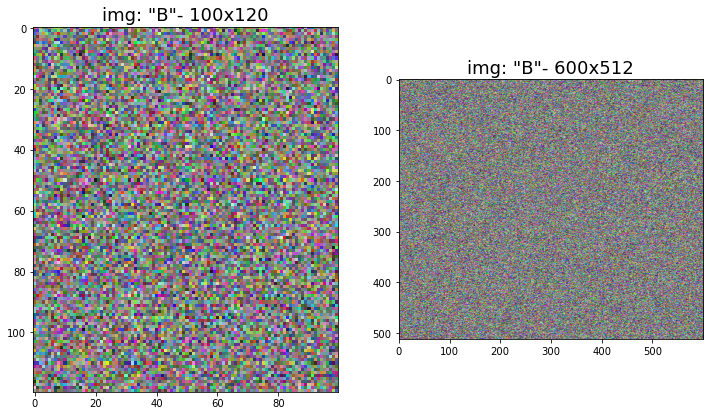

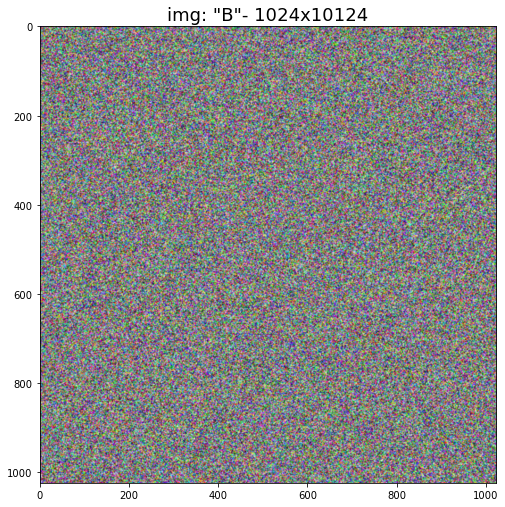

In [72]:
a=cv2.resize(B, (100, 120))
b=cv2.resize(B, (600, 512))
c=cv2.resize(B, (1024, 1024))

# OUTPUT IMAGE
fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(121)
plt.title('img: "B"- 100x120',fontsize=18)
plt.imshow(a,cmap='gray')

ax = fig.add_subplot(122)
plt.imshow(b)
ax.set_title('img: "B"- 600x512',fontsize=18)

fig2 = plt.figure(figsize=(18,10))
ax = fig2.add_subplot(121)
plt.title('img: "B"- 1024x10124',fontsize=18)
plt.imshow(c,cmap='gray')

#### c) Crop the image B of dimension 300×300 and name it B_1, the center of B and B_1 should be same. (It must be done without using imcrop function) 

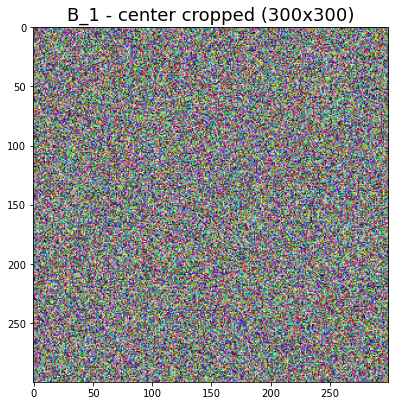

In [73]:
start=(512-300)//2
end=start+300
B_1=B[start:end , start:end]

# OUTPUT IMAGE
fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(121)
plt.title('B_1 - center cropped (300x300)',fontsize=18)
plt.imshow(B_1,cmap='gray')

#### -------d) Display the following sentence in matlab command window “The intensity value at coordinate 100×100 is _________”. 

In [74]:
print("Intensity Value at coordinate 100x100 : (R,G,B)" , list(map(int, B[100][100]*255)))

Intensity Value at coordinate 100x100 : (R,G,B) [119, 229, 18]


### 1(b) PROBLEM-2

#### Consider the Lena image of matlab and perform the following operations,

#### a) Perform the operations of Problem 1(b-c). 

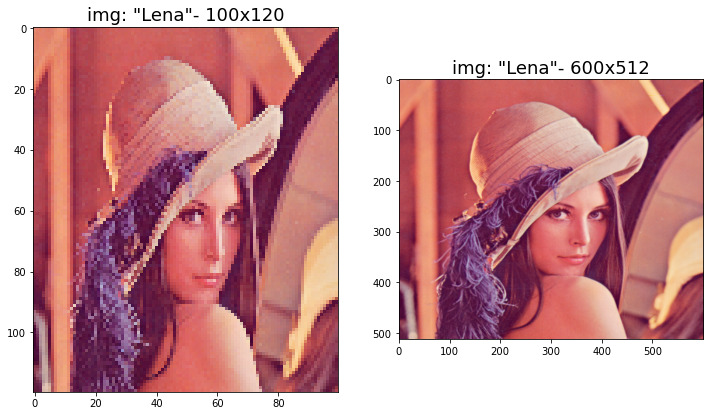

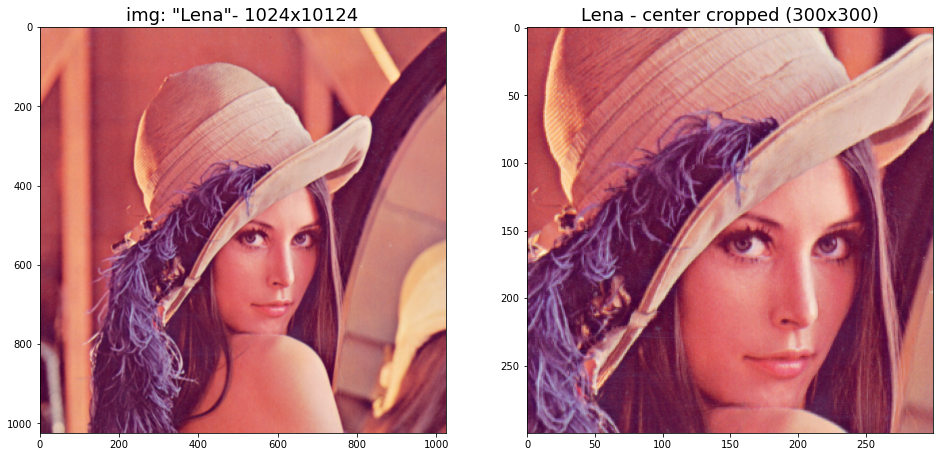

In [75]:
lena=cv2.imread("lena.png")

#Problem 1(b)
a=cv2.resize(lena, (100, 120))
b=cv2.resize(lena, (600, 512))
c=cv2.resize(lena, (1024, 1024))

# OUTPUT IMAGE
fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(121)
plt.title('img: "Lena"- 100x120',fontsize=18)
plt.imshow(cv2.cvtColor(a, cv2.COLOR_BGR2RGB))

ax = fig.add_subplot(122)
plt.imshow(cv2.cvtColor(b, cv2.COLOR_BGR2RGB))
ax.set_title('img: "Lena"- 600x512',fontsize=18)

fig2 = plt.figure(figsize=(16,10))
ax2 = fig2.add_subplot(121)
plt.title('img: "Lena"- 1024x10124',fontsize=18)
plt.imshow(cv2.cvtColor(c, cv2.COLOR_BGR2RGB))

#Problem 1(c)
start=(512-300)//2
end=start+300
lena_1=lena[start:end , start:end]

# OUTPUT IMAGE
# fig = plt.figure(figsize=(14,10))
ax2 = fig2.add_subplot(122)
plt.title('Lena - center cropped (300x300)',fontsize=18)
plt.imshow(cv2.cvtColor(lena_1, cv2.COLOR_BGR2RGB))

#### b) Rotate the original image of Lena by angles 30, 45, 60, 90, 140 and 320 degrees. (Do not use imrotate function) 

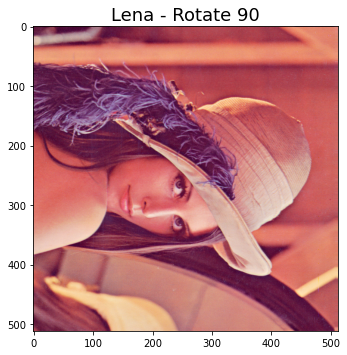

In [77]:
#rotate 90 by simple loop 
h,w,c = lena.shape
rotate_90 = np.zeros([h,w,c], dtype=np.uint8)
   
for i in range(h):
    for j in range(w):
        rotate_90[i,j] = lena[h-j-1,i-1]
        rotate_90 = rotate_90[0:h,0:w]
        
fig = plt.figure(figsize=(12,10))        
ax = fig.add_subplot(121)
plt.title('Lena - Rotate 90',fontsize=18)
plt.imshow(cv2.cvtColor(rotate_90, cv2.COLOR_BGR2RGB))

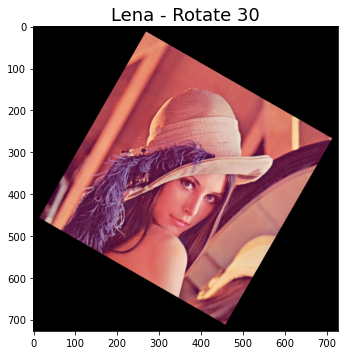

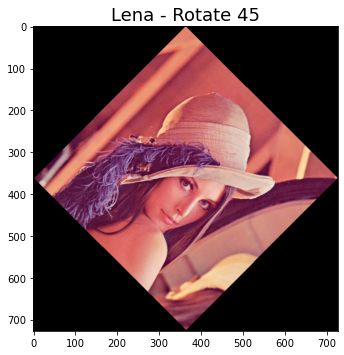

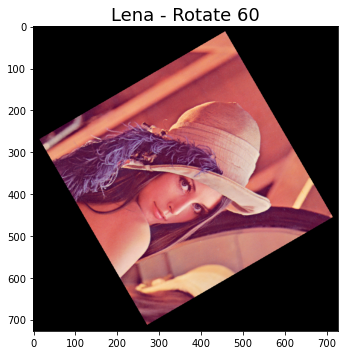

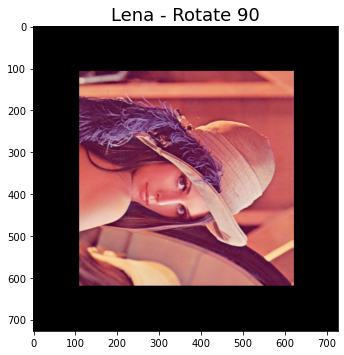

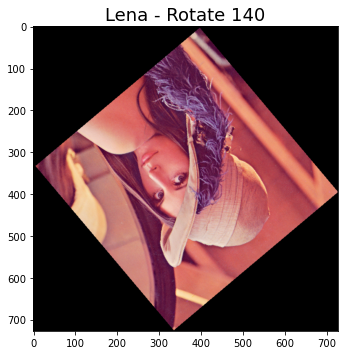

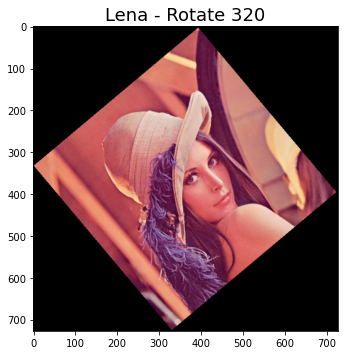

In [81]:
Rows,Cols,c = lena.shape
rotate = np.zeros((Rows,Cols), np.uint8)

#image padding
Diagonal = sqrt(Rows ** 2 + Cols ** 2)
RowPad = ceil(Diagonal - Rows) + 2
ColPad = ceil(Diagonal - Cols) + 2

imagepad = np.zeros((Rows + RowPad, Cols + ColPad, 3), dtype=np.uint8)
imagepad[RowPad//2 : RowPad//2+Rows, ColPad//2 : RowPad//2+Cols] = lena

for degree in [30, 45, 60, 90, 140 , 320]:
# degree = int(input("Enter Degree:"))
    rads=2*(22/7)*(360-degree)/360; 

    h,w,c = imagepad.shape

    #midpoints
    center_x = (h + 1) // 2
    center_y = (w + 1) // 2

    imagerot = np.zeros((h, w, 3), dtype=np.uint8)

    for i in range(0,h-1):
        for j in range(0,w-1):
            x =  (i - center_x) * cos(rads) + (j - center_y) * sin(rads)
            y = -(i - center_x) * sin(rads) + (j - center_y) * cos(rads)
            x = round(x) + center_x
            y = round(y) + center_y

            if (x >= 1 and y >= 1 and x <= w-1 and y <= h-1):
                imagerot[i, j] = imagepad[x, y]       
    
    #OUTPUT IMAGES
    fig = plt.figure(figsize=(12,10))        
    ax = fig.add_subplot(121)
    plt.title('Lena - Rotate '+ str(degree),fontsize=18)
    plt.imshow(cv2.cvtColor(imagerot, cv2.COLOR_BGR2RGB))

#### c) Crop the Lena image such that it contains only eyes, nose and mouth. (Do not use imcrop function) 

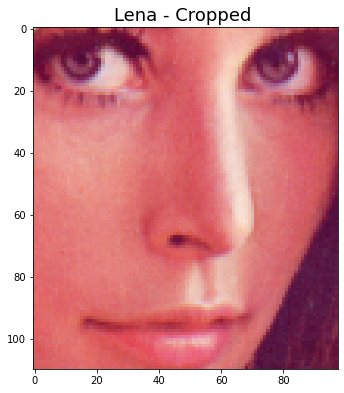

In [82]:
cropped_lena = lena[255:365,250:348]

#OUTPUT IMAGE
fig = plt.figure(figsize=(12,10))        
ax = fig.add_subplot(121)
plt.title('Lena - Cropped ',fontsize=18)
plt.imshow(cv2.cvtColor(cropped_lena, cv2.COLOR_BGR2RGB))

#### -----d) Consider an image of yours and merge it to the Lena image with various weights. (The merging of two images using weights has been covered in the demo of OpenCV, but here you have to do with Matlab) 

#### e) Convert the Lena image in gray scale first, then convert the gray scale version into logical with all the values greater than 50 to 1, otherwise 0. 

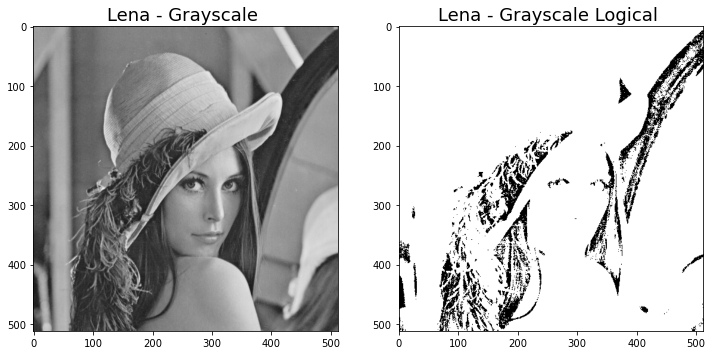

In [88]:
gray_image = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY) 

#OUTPUT IMAGE
fig = plt.figure(figsize=(12,10))        
ax = fig.add_subplot(121)
plt.title('Lena - Grayscale ',fontsize=18)
plt.imshow(cv2.cvtColor(gray_image, cv2.COLOR_BGR2RGB))

h,w = gray_image.shape
for i in range(h):
    for j in range(w):
        if gray_image[i,j]>50:
            gray_image[i,j]=255
        else:
            gray_image[i,j]=0

#OUTPUT IMAGE       
ax = fig.add_subplot(122)
plt.title('Lena - Grayscale Logical ',fontsize=18)
plt.imshow(cv2.cvtColor(gray_image, cv2.COLOR_BGR2RGB)) 

### 2(a) PROBLEM-1

#### Read the image Cameraman.tif and perform the following operations on it without using any inbuilt functions

#### 1. Rotate the Image anticlockwise by and angle of 90 degrees (Rotation around z-plane). 

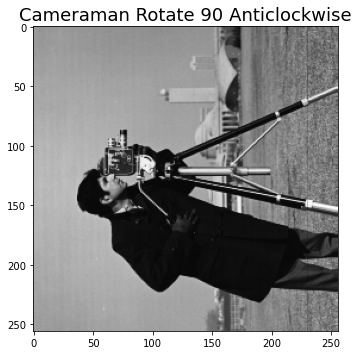

In [89]:
cameraman=cv2.imread("cameraman.tif")

h,w,c = cameraman.shape
rotate = np.zeros([h,w,c], dtype=np.uint8)
   
for i in range(h):
    for j in range(w):
        rotate[i,j] = cameraman[j,w-i-1]
        rotate = rotate[0:h,0:w]
        
#OUTPUT IMAGE 
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(121)
plt.title('Cameraman Rotate 90 Anticlockwise',fontsize=18)
plt.imshow(rotate,cmap='gray')

#### 2. Rotate the Image by and angle of 180 degrees (Rotation around y-plane) 

In [101]:
Rows,Cols,c = lena.shape
rotate = np.zeros((Rows,Cols), np.uint8)

#image padding
Diagonal = sqrt(Rows ** 2 + Cols ** 2)
RowPad = ceil(Diagonal - Rows) + 2
ColPad = ceil(Diagonal - Cols) + 2

imagepad = np.zeros((Rows + RowPad, Cols + ColPad, 3), dtype=np.uint8)
imagepad[RowPad//2 : RowPad//2+Rows, ColPad//2 : RowPad//2+Cols] = lena

degree = int(input("Enter Degree:"))
rads=2*(22/7)*(360-degree)/360; 

h,w,c = imagepad.shape

#midpoints
center_x = (h + 1) // 2
center_y = (w + 1) // 2
center_z = (c + 1) // 2

imagerot = np.zeros((h, w, 3), dtype=np.uint8)

for i in range(0,h-1):
    for j in range(0,w-1):
        x =  (i - center_z) * cos(rads) + (j - center_x) * sin(rads)
        y = -(i - center_z) * sin(rads) + (j - center_x) * cos(rads)
        x = round(x) + center_x
        y = round(y) + center_z

        if (x >= 1 and y >= 1 and x <= w-1 and y <= h-1):
            imagerot[i, j] = imagepad[x, y]       
            
cv2.imshow('rotate_img',imagerot)
cv2.waitKey(0)

Enter Degree:90


-1

#### 3. Crop the image rectangular way to form a croped image B of dimension (N1xN2), starting from (n1xn2).

Enter N1:50
Enter N2:70


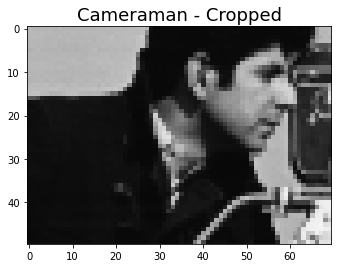

In [93]:
N1 = int(input("Enter N1:"))
N2 = int(input("Enter N2:"))

h,w,c = cameraman.shape
if N1*2>h or N2*2>w:
    print("Error: Cropping size out of image area.")
else:
    cropped = cameraman[N1:N1*2 , N2:N2*2]
    
    #OUTPUT IMAGE 
    fig = plt.figure(figsize=(12,6))
    ax = fig.add_subplot(121)
    plt.title('Cameraman - Cropped',fontsize=18)
    plt.imshow(cropped,cmap='gray')

### 2(a) PROBLEM-2

#### Read the image Cameraman.tif and

#### 1. Plot the histogram of the gray distribution without using the imhist()function. Also plot the normalized histogram for the same. Show the histogram and normalized histogram in the same figure using subplot. Use barchart and the linegraph for the plots.

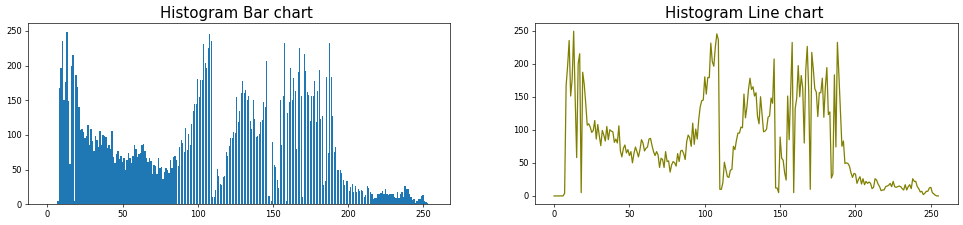

In [101]:
img=cv2.imread("cameraman.tif",cv2.IMREAD_GRAYSCALE)

height = img.shape[0]
width = img.shape[1]

arrx=np.zeros((256),np.uint8)

for i in range (height):
    for j in range (width):
        arrx[img[i][j]]+=1
        
#OUTPUT HISTOGRAM        
fig = plt.figure(figsize=(20,4), dpi=60)
ax = fig.add_subplot(121)
plt.title('Histogram Bar chart ',fontsize=18)
plt.bar(range(256),arrx)     
ax = fig.add_subplot(122)
plt.title('Histogram Line chart ',fontsize=18)
plt.plot(range(256),arrx, color="olive") 

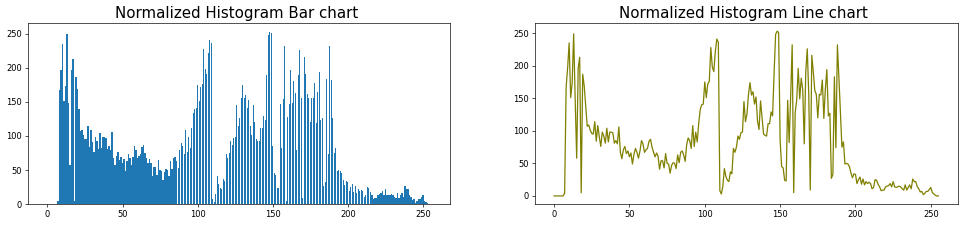

In [102]:
pixels = np.asarray(img)
pixels = pixels.astype('float32')
pixels /= 255.0
arrx2=np.zeros((256),np.uint8)

for i in range (255):
    for j in range (255):
        arrx2[int(pixels[i][j]*255)]+=1
        
#OUTPUT HISTOGRAM        
fig = plt.figure(figsize=(20,4), dpi=60)
ax = fig.add_subplot(121)
plt.title('Normalized Histogram Bar chart ',fontsize=18)
plt.bar(range(256),arrx2)     
ax = fig.add_subplot(122)
plt.title('Normalized Histogram Line chart ',fontsize=18)
plt.plot(range(256),arrx2, color="olive") 

<Figure size 1120x320 with 0 Axes>

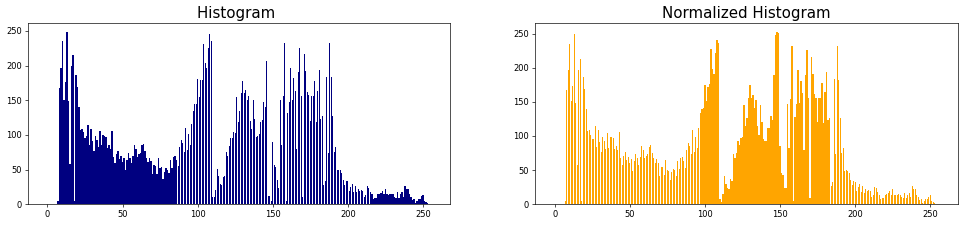

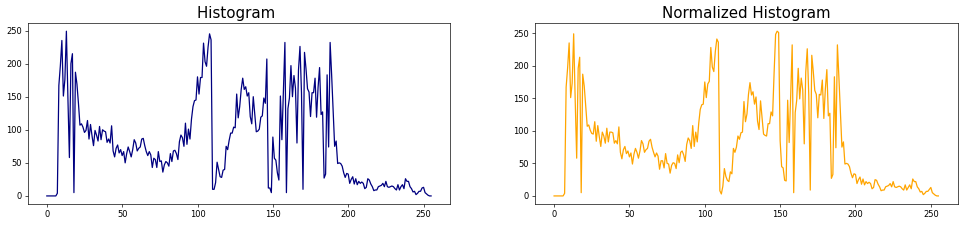

In [110]:
#histogram and normalized with 20 bins 
figure(num=None, figsize=(14, 4), dpi=80)

#OUTPUT HISTOGRAM        
fig = plt.figure(figsize=(20,4), dpi=60)
ax = fig.add_subplot(121)
plt.title('Histogram ',fontsize=18)
plt.bar(range(256),arrx, color="navy")  
ax = fig.add_subplot(122)
plt.title('Normalized Histogram',fontsize=18)
plt.bar(range(256),arrx2, color="orange")

fig2 = plt.figure(figsize=(20,4), dpi=60)
ax = fig2.add_subplot(121)
plt.title('Histogram ',fontsize=18)
plt.plot(range(256),arrx, color="navy")  
ax = fig2.add_subplot(122)
plt.title('Normalized Histogram',fontsize=18)
plt.plot(range(256),arrx2, color="orange")

#### 2. Now plot the histogram using the imhist() function. Analyze the outputs obtained from both the methods. What is the effect of changing the bins while plotting the histograms? 

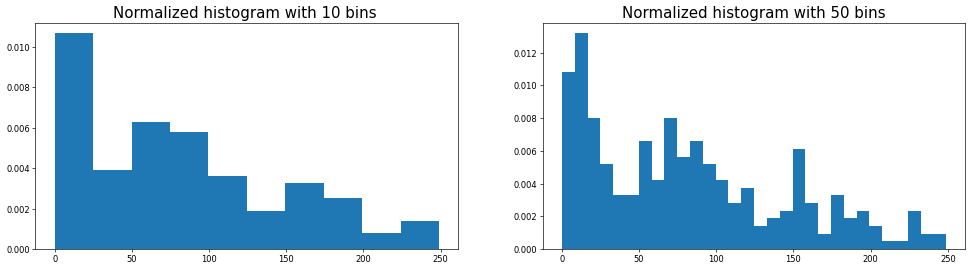

In [114]:
#OUTPUT HISTOGRAM        
fig = plt.figure(figsize=(20,5), dpi=60)
ax = fig.add_subplot(121)

#Normalized histogram with 10 bins 
plt.title('Normalized histogram with 10 bins ',fontsize=18)
n, x, _ = plt.hist(arrx, bins=10,  density=True) 

ax = fig.add_subplot(122)

#Normalized histogram with 50 bins 
plt.title('Normalized histogram with 50 bins',fontsize=18)
n2, x2, _ = plt.hist(arrx, bins=30,  density=True)  


### 2(a) PROBLEM-3

#### Read the image Cameraman.tif and perform the following operations on it without using the inbuilt functions. Plot the original and all the transformed images along with their histograms. Discuss the suitable application areas for each of the following transformations. 

#### 1. Form the digital negative of the image cameraman.

<BarContainer object of 256 artists>

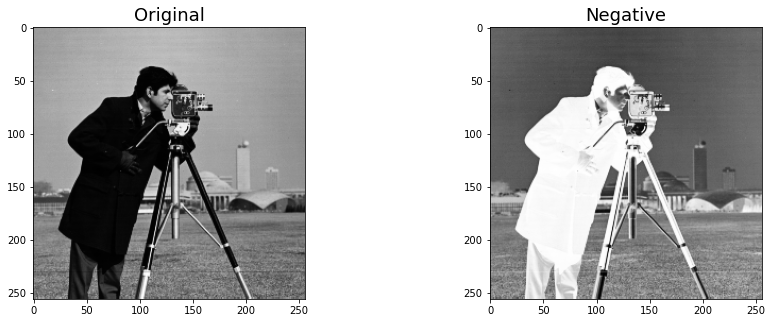

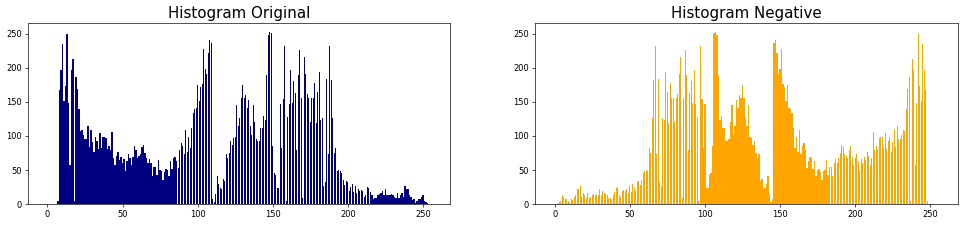

In [117]:
cam_man = cv2.imread('cameraman.tif',0)
negative = 255 - cam_man
fig = plt.figure(figsize=(15,5))

ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(cam_man,cmap='gray')

ax = fig.add_subplot(122)
plt.imshow(negative,cmap='gray')
ax.set_title('Negative',fontsize=18)

h1=np.zeros((256),np.uint8)
h2=np.zeros((256),np.uint8)

for i in range (255):
    for j in range (255):
        h1[cam_man[i][j]]+=1
        h2[negative[i][j]]+=1

#OUTPUT HISTOGRAM        
fig2 = plt.figure(figsize=(20,4), dpi=60)

ax = fig2.add_subplot(121)
plt.title('Histogram Original',fontsize=18)
plt.bar(range(256),h1,color="navy") #Original image histogram   

ax = fig2.add_subplot(122)
plt.title('Histogram Negative',fontsize=18)
plt.bar(range(256),h2, color="orange") #Processed image histogram  

#### 2. Find out the nth Root transformation of cameraman.tif for n=0.8, 0.9, 1.1, 1.2.

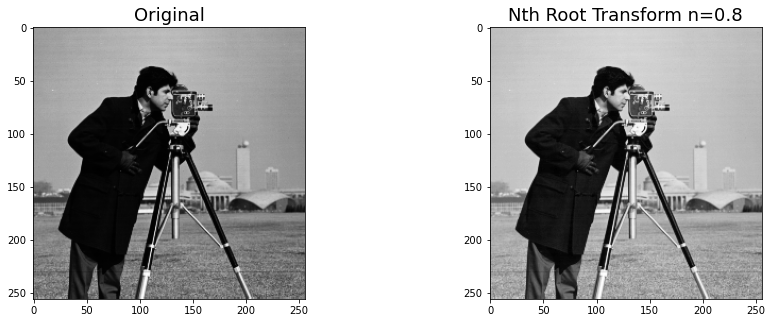

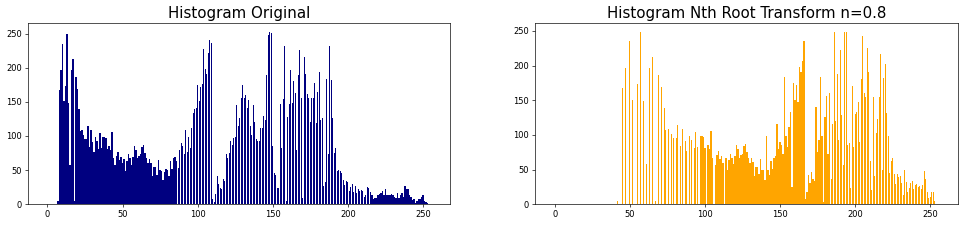

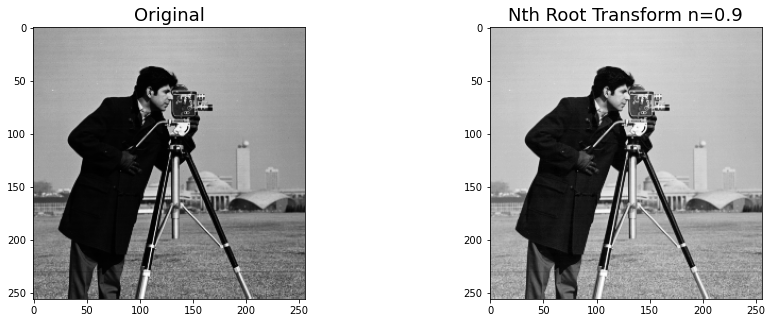

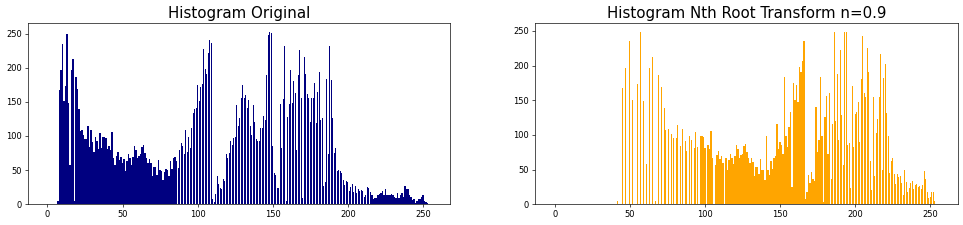

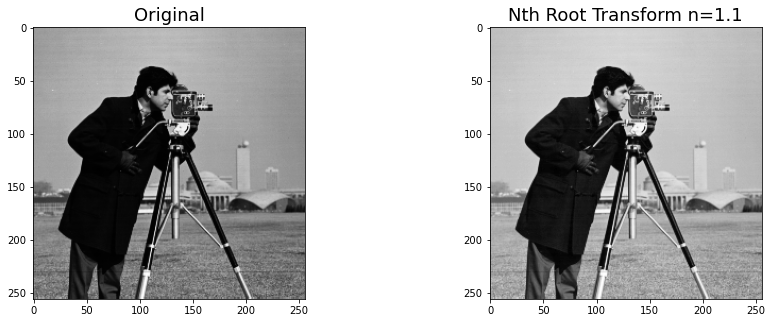

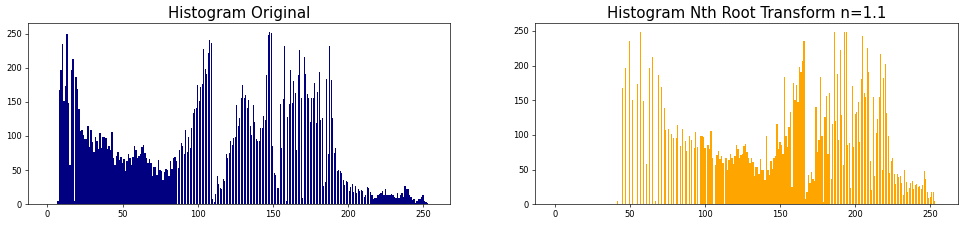

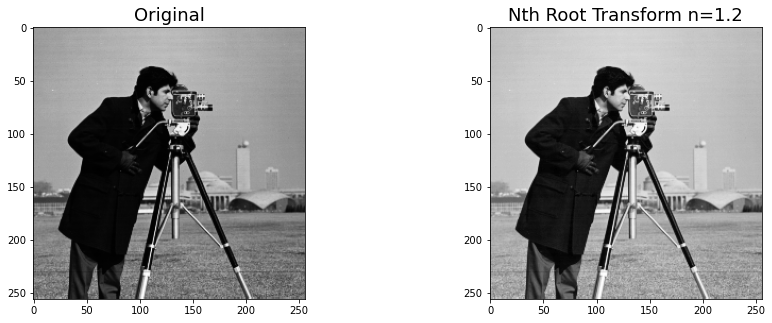

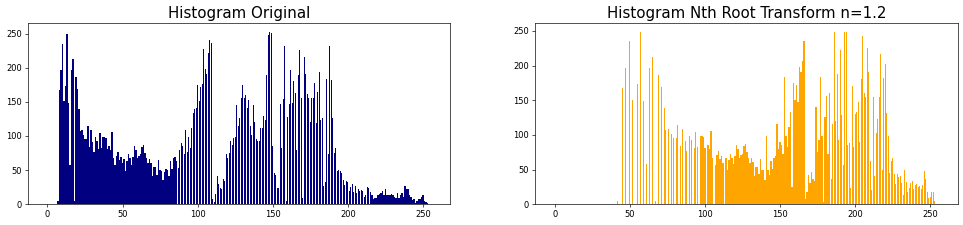

In [125]:
cam_man1 = cam_man/255.0
for n in [0.8, 0.9, 1.1, 1.2]:
    # n = float(input("Enter n:"))
    cam_man_root = cv2.sqrt(cam_man1,n)

    fig = plt.figure(figsize=(15,5))

    ax = fig.add_subplot(121)
    plt.title('Original',fontsize=18)
    plt.imshow(cam_man,cmap='gray')

    ax = fig.add_subplot(122)
    plt.imshow(cam_man_root,cmap='gray')
    ax.set_title('Nth Root Transform n='+str(n),fontsize=18)

    h1=np.zeros((256),np.uint8)
    h2=np.zeros((256),np.uint8)

    for i in range (255):
        for j in range (255):
            h1[cam_man[i][j]]+=1
            h2[int((cam_man_root[i][j])*255)]+=1

    #OUTPUT HISTOGRAM        
    fig2 = plt.figure(figsize=(20,4), dpi=60)

    ax = fig2.add_subplot(121)
    plt.title('Histogram Original',fontsize=18)
    plt.bar(range(256),h1,color="navy") #Original image histogram   

    ax = fig2.add_subplot(122)
    plt.title('Histogram Nth Root Transform n='+str(n),fontsize=18)
    plt.bar(range(256),h2, color="orange") #Processed image histogram  

#### 3. Log transform where, c=1, 2, 3

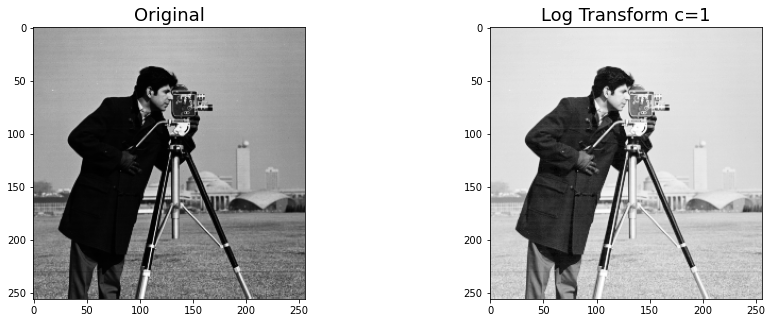

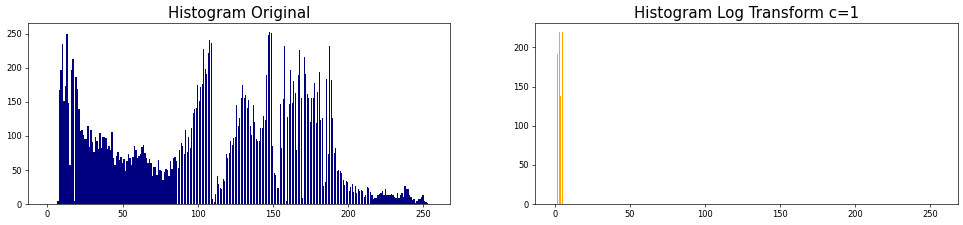

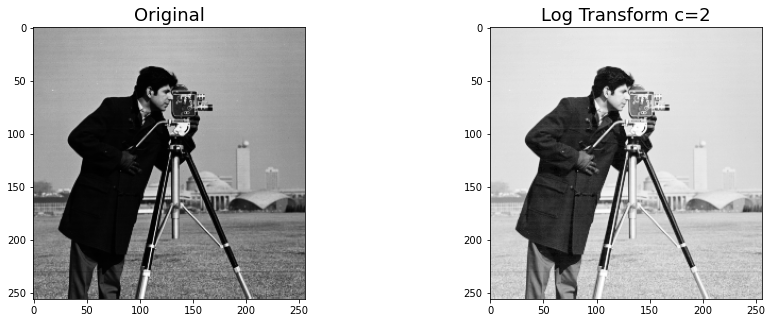

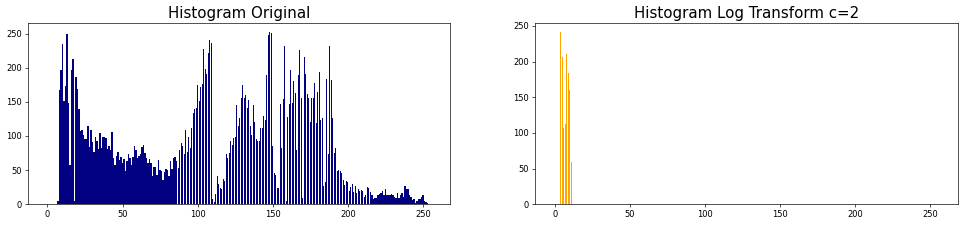

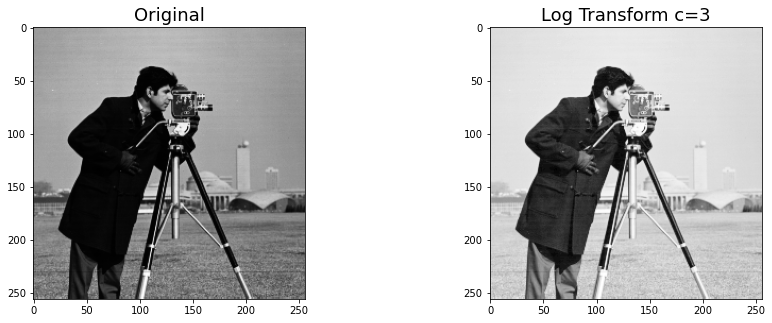

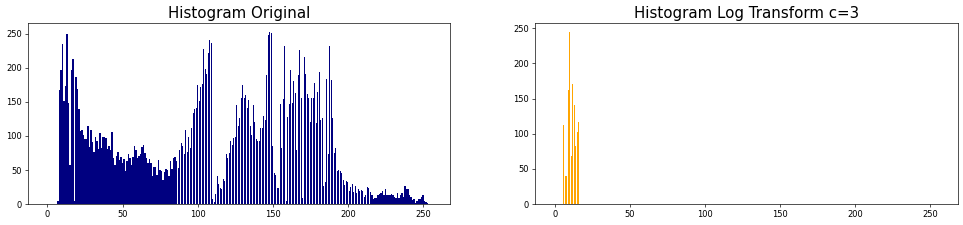

In [128]:
for c in [1,2,3]:
    # c = int(input("Enter c:"))
    cam_man_log = c * (np.log(1 + np.float32(cam_man)))

    fig = plt.figure(figsize=(15,5))

    ax = fig.add_subplot(121)
    plt.title('Original',fontsize=18)
    plt.imshow(cam_man,cmap='gray')

    ax = fig.add_subplot(122)
    plt.imshow(cam_man_log,cmap='gray')
    ax.set_title('Log Transform c='+str(c),fontsize=18)


    h1=np.zeros((256),np.uint8)
    h2=np.zeros((256),np.uint8)

    for i in range (255):
        for j in range (255):
            h1[cam_man[i][j]]+=1
            h2[int((cam_man_log[i][j]))]+=1
            
    #OUTPUT HISTOGRAM        
    fig2 = plt.figure(figsize=(20,4), dpi=60)

    ax = fig2.add_subplot(121)
    plt.title('Histogram Original',fontsize=18)
    plt.bar(range(256),h1,color="navy") #Original image histogram   

    ax = fig2.add_subplot(122)
    plt.title('Histogram Log Transform c='+str(c),fontsize=18)
    plt.bar(range(256),h2, color="orange") #Processed image histogram  

#### 4. First of all apply the power law transform to perform the gamma corruption, using GAMMA=.1 and the correct this image again using Gamma correction. 

<BarContainer object of 256 artists>

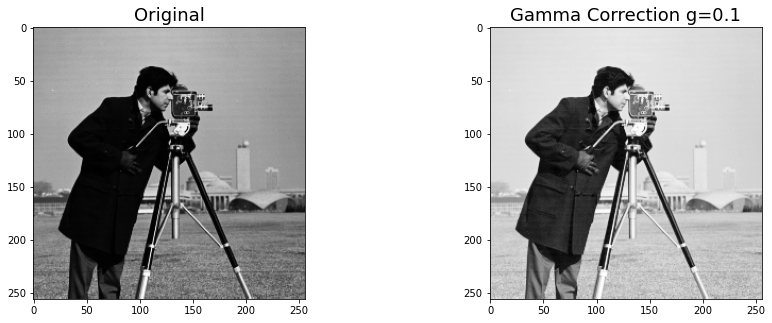

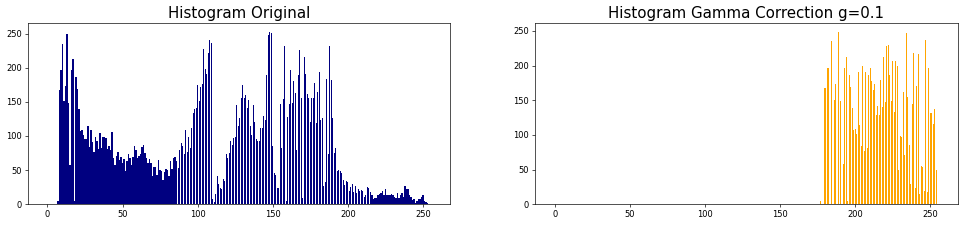

In [130]:
cam_man1 = cam_man/255.0
g = 0.1
cam_man_gama = cv2.pow(cam_man1,g) 
  
fig = plt.figure(figsize=(15,5))

ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(cam_man,cmap='gray')

ax = fig.add_subplot(122)
plt.imshow(cam_man_gama,cmap='gray')
ax.set_title('Gamma Correction g='+str(g),fontsize=18)

h1=np.zeros((256),np.uint8)
h2=np.zeros((256),np.uint8)

for i in range (255):
    for j in range (255):
        h1[cam_man[i][j]]+=1
        h2[int((cam_man_gama[i][j])*255)]+=1
        
#OUTPUT HISTOGRAM        
fig2 = plt.figure(figsize=(20,4), dpi=60)

ax = fig2.add_subplot(121)
plt.title('Histogram Original',fontsize=18)
plt.bar(range(256),h1,color="navy") #Original image histogram   

ax = fig2.add_subplot(122)
plt.title('Histogram Gamma Correction g='+str(g),fontsize=18)
plt.bar(range(256),h2, color="orange") #Processed image histogram     

### Lab Assignment - 2(b)

#### PROBLEM-1  Take an image and perform contrast stretching in that using the function: Where a and b are minimum and maximum intensity values of the given image, c and d are minimum and maximum intensity values of the targeted image. 

Text(0.5, 1.0, 'Contrast Streching')

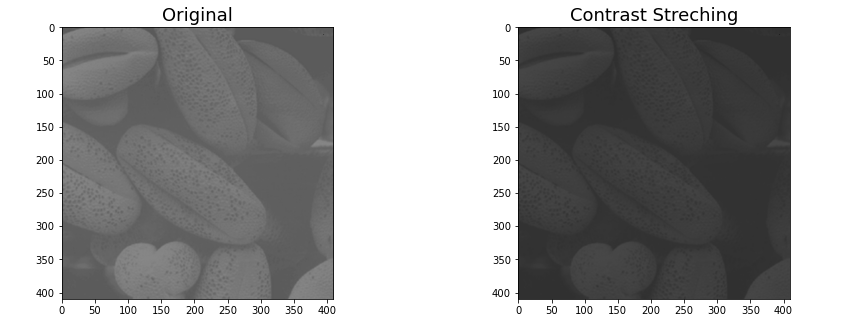

In [131]:
original_grain = cv2.imread('grain.png')

h,w,c=original_grain.shape

pixels = np.array(original_grain)

new_grain = np.zeros((h,w,c), np.uint8)

a = pixels.min()  # minimum intensity values of the given image
b = pixels.max()  # maximum intensity values of the given image
c = 0             # minimum intensity values of the targeted image
d = 255           # maximum intensity values of the targeted image

for i in range (h):
    for j in range (w):
        r=original_grain[i,j]
        new_grain[i,j] = ((r-c)*((b-a)/(d-c)))+a

fig = plt.figure(figsize=(15,5))        

plt.axis("off")
ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(cv2.cvtColor(original_grain, cv2.COLOR_BGR2RGB))

ax = fig.add_subplot(122)
plt.imshow(cv2.cvtColor(new_grain, cv2.COLOR_BGR2RGB))
ax.set_title('Contrast Streching',fontsize=18)

#### PROBLEM-2  Create histogram of the image before contrast stretching and after contrast stretching. 

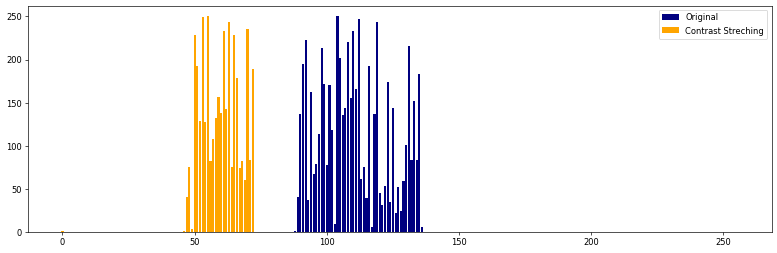

In [137]:
h1=np.zeros((256),np.uint8)
h2=np.zeros((256),np.uint8)

for i in range (h):
    for j in range (w):
        h1[original_grain[i][j]]+=1
        h2[new_grain[i][j]]+=1
        
figure(num=None, figsize=(16, 5), dpi=60)
plt.bar(range(256),h1, label="Original" ,color="navy") #Original image histogram 
plt.bar(range(256),h2, label="Contrast Streching", color="orange") #Processed image histogram  
plt.legend(loc="upper right")
plt.show()

#### PROBLEM-3  Capture an image from webcam / mobile phone in dim light and enhance the image using histogram equalization. 

Text(0.5, 1.0, 'Histogram Equalized')

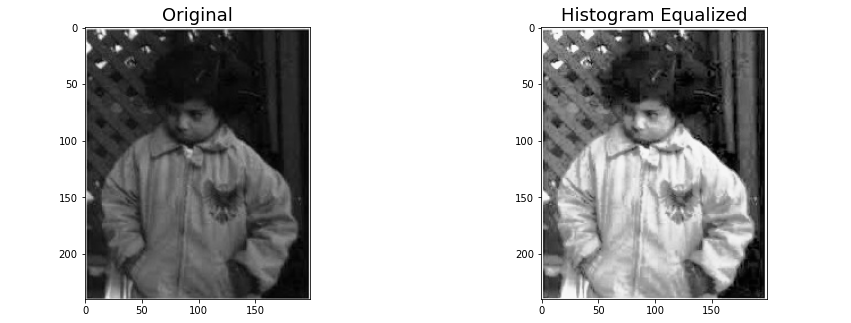

In [138]:
original = cv2.imread("pout.tif")
im = cv2.imread("pout.tif")
rows = im.shape[0]
cols = im.shape[1]

pxint = []
cumf = []
for i in range(0,256):
    pxint.append(0)
    cumf.append(0)
totpx = 0

for i in range(0,rows):
    for j in range(0,cols):
        pxint[im[i][j][0]]+=1
        pxint[im[i][j][1]]+=1
        pxint[im[i][j][2]]+=1
        totpx+=3

#cumulative
cumf[0] = pxint[0]
for i in range(1,256):
    cumf[i] = cumf[i-1]+pxint[i]

#cumulative ratio
for i in range(0,256):
    cumf[i] = math.floor((cumf[i]/totpx)*255)

for i in range(0,rows):
    for j in range(0,cols):
        im[i][j][0] = cumf[im[i][j][0]]
        im[i][j][1] = cumf[im[i][j][1]]
        im[i][j][2] = cumf[im[i][j][2]]

img = Image.fromarray(im)

fig = plt.figure(figsize=(15,5))

plt.axis("off")
ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(original)

ax = fig.add_subplot(122)
plt.imshow(img)
ax.set_title('Histogram Equalized',fontsize=18)



#### PROBLEM-4  Take the same captured image and perform contrast stretching and also compare it with the generated image after scaling the image by a factor of say three. 

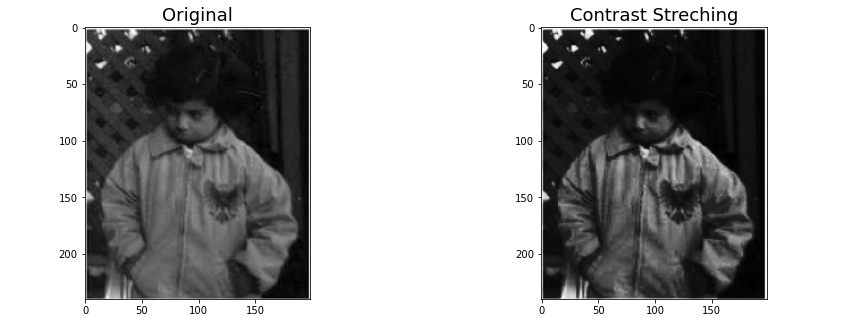

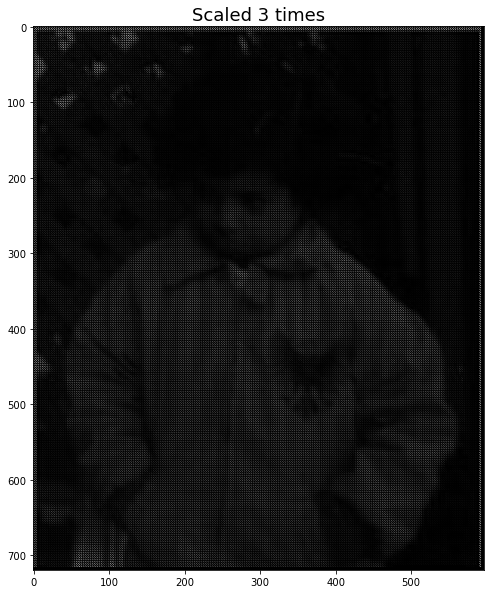

In [139]:
original=cv2.imread("pout.tif",cv2.IMREAD_GRAYSCALE)

height = original.shape[0]
width = original.shape[1]

#contrast streching
new_contrast = np.zeros((height,width,3), np.uint8)

for i in range (height):
    for j in range (width):
        if original[i][j]<=80:
            new_contrast[i][j]=int(original[i][j]/2)
        elif original[i][j]>80 and original[i][j]<=160:
            new_contrast[i][j]=original[i][j]*2-120
        else:
            new_contrast[i][j]=200+int((original[i][j]-160)*(55/95))

#image scaling to 3X
height*=3
width*=3
new_3X = np.zeros((height,width,3), np.uint8)

for i in range (int(height/3)-1):
    for j in range (int(width/3)-1):
        new_3X[3*i,3*j]=original[i,j]
        new_3X[3*i+1,3*j+1]=original[i,j]
        
fig = plt.figure(figsize=(15,5))        

plt.axis("off")
ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))

ax = fig.add_subplot(122)
plt.imshow(cv2.cvtColor(new_contrast, cv2.COLOR_BGR2RGB))
ax.set_title('Contrast Streching',fontsize=18)

fig2 = plt.figure(figsize=(25,10)) 
ax2 = fig2.add_subplot(121)
plt.title('Scaled 3 times',fontsize=18)
plt.imshow(new_3X)

#### PROBLEM-5  Take an image let's say "coin.jpg", select ROI of any random size and convert pixels values within it in 8-bit binary format. 

In [140]:
coin = cv2.imread("coin.tif",cv2.IMREAD_GRAYSCALE)
roi = np.zeros((50,50),  dtype = 'int')
for i in range(50):
    for j in range(50):
        roi[i,j] = format(coin[i,j],'08b')
roi

array([[11111111, 11100010, 11100001, ..., 11100101, 11100101, 11100101],
       [11111111, 11100010, 11100001, ..., 11100101, 11100101, 11100101],
       [11111111, 11100010, 11100001, ..., 11100101, 11100101, 11100101],
       ...,
       [11111111, 11100010, 11100001, ..., 11100001, 11100000, 11100100],
       [11111111, 11100010, 11100001, ..., 11100011, 11100100, 11100111],
       [11111111, 11100010, 11100001, ..., 11100011, 11100011, 11100111]])

#### PROBLEM-6  Display the image for LSB and MSB and plot histogram for these images.

#### PROBLEM-7 Split the image in bit planes and then combine bit plane 𝑎𝑏 times. Compare histogram for these images using bin to bin and cross bin comparison method. 

Text(0.5, 1.0, 'Bit plane 8')

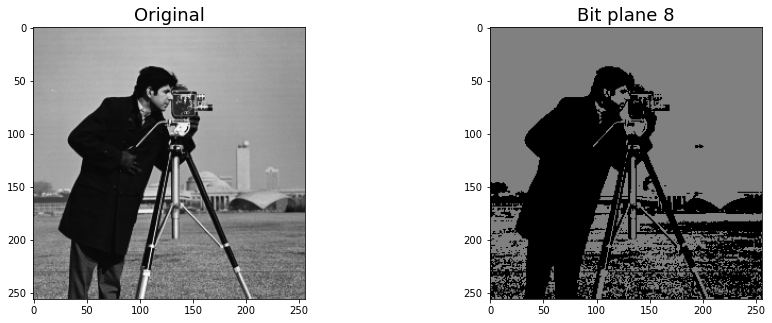

In [100]:
original_img = cv2.imread('cameraman.tif')
bit_plane = cv2.imread('cameraman.tif')
bit_plane_no = 8

for i in range(0, original.shape[0]):
    for j in range(0, original.shape[1]):
        bit_plane[i,j] = (original[i,j] & 2**(bit_plane_no-1))
fig = plt.figure(figsize=(15,5))

ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(original_img,cmap='gray')

ax = fig.add_subplot(122)
plt.imshow(bit_plane,cmap='gray')
ax.set_title('Bit plane '+str(bit_plane_no),fontsize=18)

In [101]:
# Load the images
img1 = cv2.imread('cameraman.tif')
img2 = cv2.imread('lena.png')

# Convert it to HSV
img1_hsv = cv2.cvtColor(original_img, cv2.COLOR_BGR2HSV)
img2_hsv = cv2.cvtColor(bit_plane, cv2.COLOR_BGR2HSV)

# Calculate the histogram and normalize it
hist_img1 = cv2.calcHist([img1_hsv], [0,1], None, [180,256], [0,180,0,256])
cv2.normalize(hist_img1, hist_img1, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX);
hist_img2 = cv2.calcHist([img2_hsv], [0,1], None, [180,256], [0,180,0,256])
cv2.normalize(hist_img2, hist_img2, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX);

# find the metric value
metric_val = cv2.compareHist(hist_img1, hist_img2, cv2.HISTCMP_INTERSECT)
print(metric_val)

1.0


#### PROBLEM-8  Take a low contrast image of yourself using webcam & perform following point processing operations.

#### (a) Log-transform

Text(0.5, 1.0, 'Log Transform')

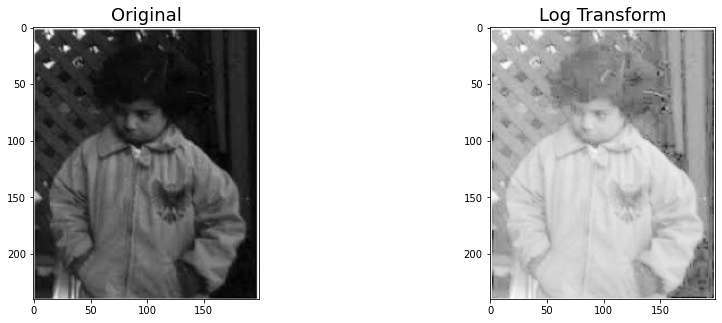

In [146]:
original=cv2.imread("pout.tif",0)
original_log = 0.6 * (np.log(1 + np.float32(original)))

fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(original,cmap='gray')

ax = fig.add_subplot(122)
plt.imshow(original_log,cmap='gray')
ax.set_title('Log Transform',fontsize=18)

#### (b) Inverse log transform

c:\users\satya\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: overflow encountered in exp
  """Entry point for launching an IPython kernel.


Text(0.5, 1.0, 'Inverse Log Transform')

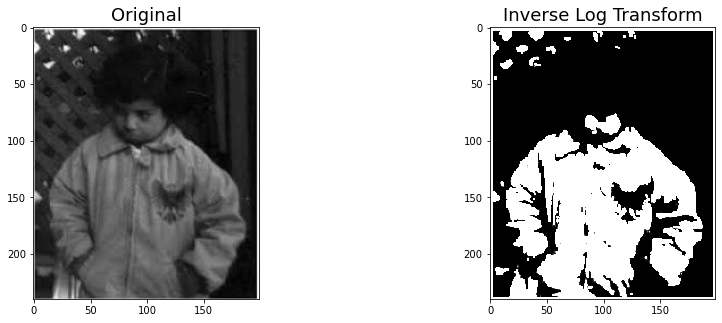

In [147]:
original_log_inv = 0.6 * (np.exp(1 + np.float32(original)))

fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(original,cmap='gray')

ax = fig.add_subplot(122)
plt.imshow(original_log_inv,cmap='gray')
ax.set_title('Inverse Log Transform',fontsize=18)

#### (c) Square

Text(0.5, 1.0, 'Square')

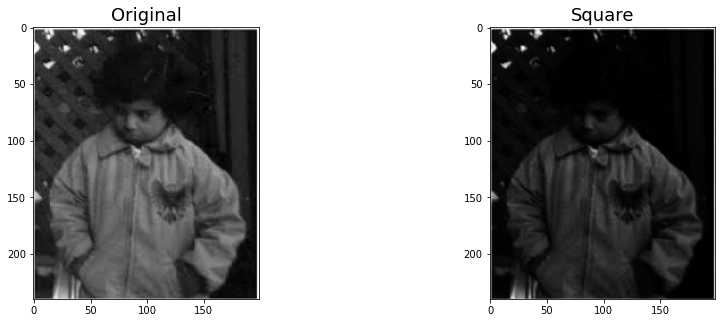

In [148]:
Square = cv2.pow(original/255.0,2) 
fig = plt.figure(figsize=(15,5))

ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(original,cmap='gray')

ax = fig.add_subplot(122)
plt.imshow(Square,cmap='gray')
ax.set_title('Square',fontsize=18)

#### (d) Square root

Text(0.5, 1.0, 'Square Root')

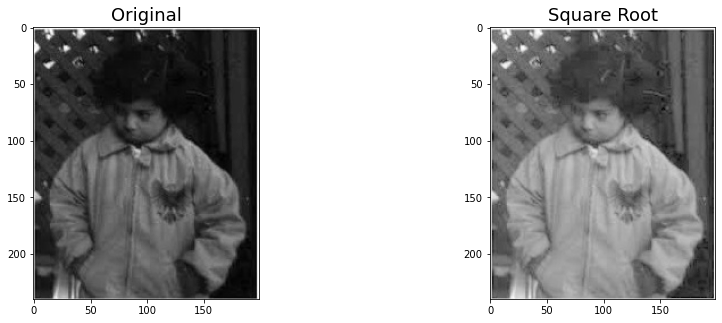

In [150]:
Square_root = cv2.sqrt(original/255.0,2) 
fig = plt.figure(figsize=(15,5))

ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(original,cmap='gray')

ax = fig.add_subplot(122)
plt.imshow(Square_root,cmap='gray')
ax.set_title('Square Root',fontsize=18)

#### (e) Negatives 

Text(0.5, 1.0, 'Negative')

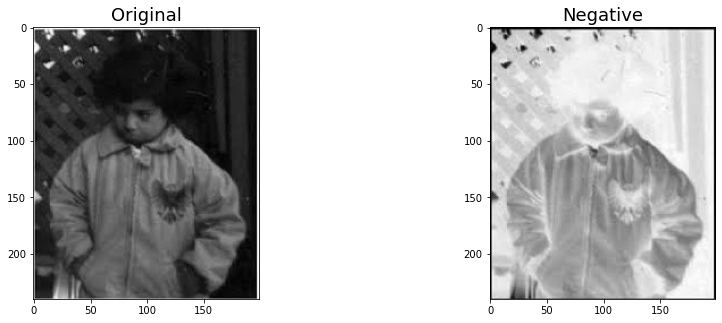

In [151]:
negative = 255 - original
fig = plt.figure(figsize=(15,5))

ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(original,cmap='gray')

ax = fig.add_subplot(122)
plt.imshow(negative,cmap='gray')
ax.set_title('Negative',fontsize=18)

#### PROBLEM-9  Perform a transform on an original picture with c = 1 & gamma = 0.2. Now perform the reverse transformation on the same picture, with c = 1 & gamma = 1/.2. Compare the histogram of both images.

<BarContainer object of 256 artists>

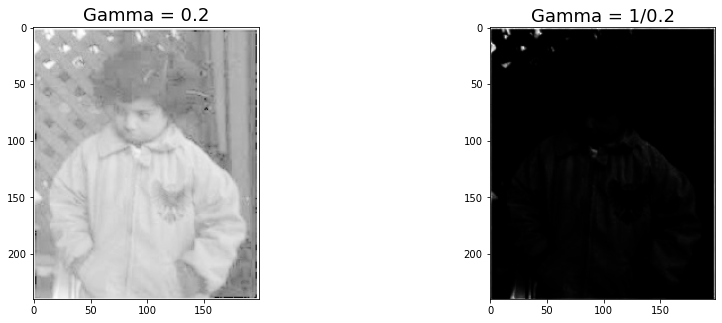

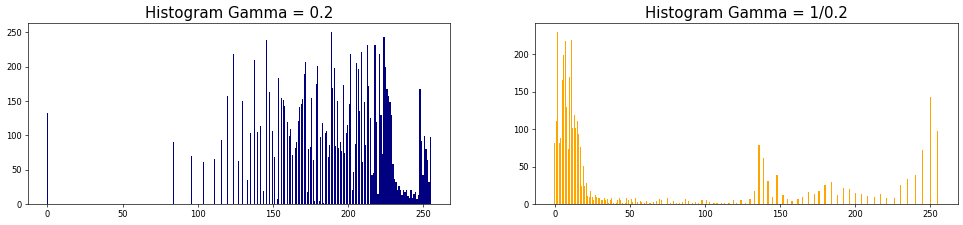

In [153]:
new_img1 = original/255.0
new_img2 = original/255.0
gama1 = 1.0 * cv2.pow(new_img1,0.2) 
gama2 = 1.0 * cv2.pow(new_img1,(1/0.2)) 
  
fig = plt.figure(figsize=(15,5))

ax = fig.add_subplot(121)
plt.title('Gamma = 0.2',fontsize=18)
plt.imshow(gama1,cmap='gray')

ax = fig.add_subplot(122)
plt.imshow(gama2,cmap='gray')
ax.set_title('Gamma = 1/0.2',fontsize=18)

h1=np.zeros((256),np.uint8)
h2=np.zeros((256),np.uint8)

for i in range (original.shape[0]):
    for j in range (original.shape[1]):
        h1[int((gama1[i][j])*255)]+=1
        h2[int((gama2[i][j])*255)]+=1
        
#OUTPUT HISTOGRAM        
fig2 = plt.figure(figsize=(20,4), dpi=60)

ax = fig2.add_subplot(121)
plt.title('Histogram Gamma = 0.2',fontsize=18)
plt.bar(range(256),h1,color="navy") #Original image histogram   

ax = fig2.add_subplot(122)
plt.title('Histogram Gamma = 1/0.2',fontsize=18)
plt.bar(range(256),h2, color="orange") #Processed image histogram 

### 2(c)

#### 1) Split the given Mars_Rover Image in bit planes and then combine the image using any three bit planes. Compare the histograms for the bit planes images using bin to bin and cross bin comparison method.

Text(0.5, 1.0, 'Bit Slicing (3 planes)')

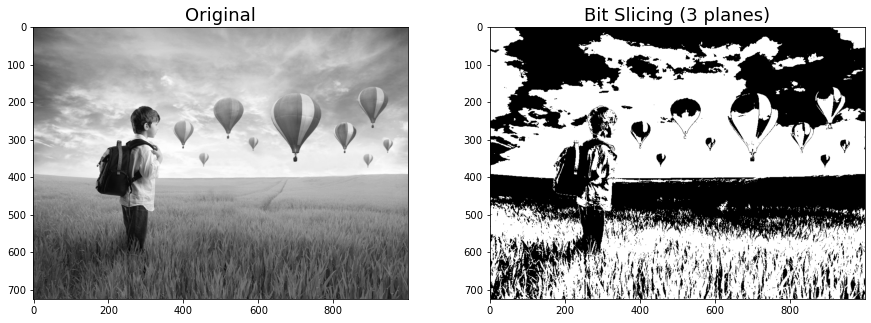

In [196]:
import random
mars=cv2.imread("mars_rover.jpg",cv2.IMREAD_GRAYSCALE)

height = mars.shape[0]
width = mars.shape[1]

mars_bit = np.zeros((height,width,3), np.uint8)
for k in random.sample(range(0, 7), 3):
    for i in range (height):
        for j in range (width):
            mars_bit[i,j]=(mars[i,j]&pow(2,k))*255/pow(2,k)
            
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(mars,cmap='gray')

ax = fig.add_subplot(122)
plt.imshow(mars_bit,cmap='gray')
ax.set_title('Bit Slicing (3 planes)',fontsize=18)

### Convert it to HSV
img1_hsv = cv2.cvtColor(mars, cv2.COLOR_BGR2HSV)
img2_hsv = cv2.cvtColor(mars_bit, cv2.COLOR_BGR2HSV)

# Calculate the histogram and normalize it
hist_img1 = cv2.calcHist([img1_hsv], [0,1], None, [180,256], [0,180,0,256])
cv2.normalize(hist_img1, hist_img1, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX);
hist_img2 = cv2.calcHist([img2_hsv], [0,1], None, [180,256], [0,180,0,256])
cv2.normalize(hist_img2, hist_img2, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX);

# find the metric value
metric_val = cv2.compareHist(hist_img1, hist_img2, cv2.HISTCMP_INTERSECT)
print(metric_val)

#### 2) In the following images enhance the image from left to the right side image without using auto enhancement methods.

Text(0.5, 1.0, 'Enhanced')

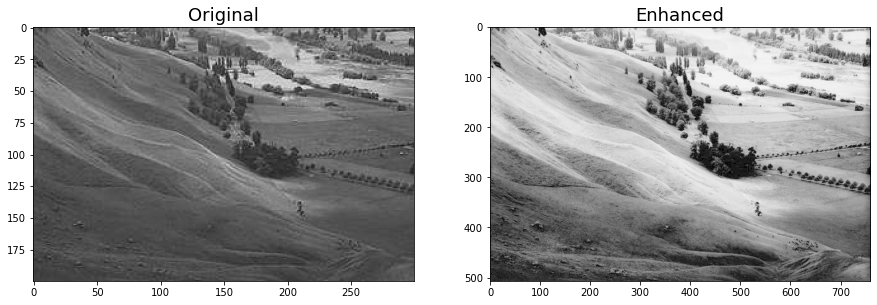

In [154]:
img0=cv2.imread("low.jpg",cv2.IMREAD_GRAYSCALE)
img1=cv2.imread("low2.jpg",cv2.IMREAD_GRAYSCALE)

enhanced = cv2.sqrt(img1/255.0,2) 
fig = plt.figure(figsize=(15,5))

ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(img0,cmap='gray')

ax = fig.add_subplot(122)
plt.imshow(enhanced,cmap='gray')
ax.set_title('Enhanced',fontsize=18)

Text(0.5, 1.0, 'Enhanced')

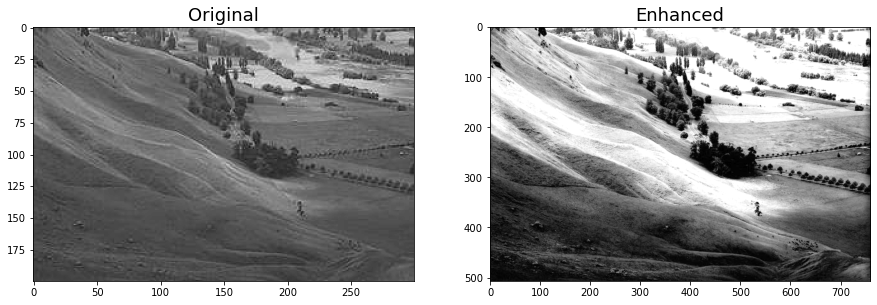

In [155]:
im=cv2.imread("low.jpg",cv2.IMREAD_GRAYSCALE)
img=cv2.imread("low2.jpg",cv2.IMREAD_GRAYSCALE)
cols, rows = img.shape
brightness = np.sum(img) / (255 * cols * rows)

minimum_brightness = 0.55

ratio = brightness / minimum_brightness
if ratio < 1:
    bright_img =  cv2.convertScaleAbs(img, alpha = 1 / ratio, beta = 0)

fig = plt.figure(figsize=(15,5))

ax = fig.add_subplot(121)
plt.title('Original',fontsize=18)
plt.imshow(im,cmap='gray')


ax = fig.add_subplot(122)
plt.imshow(bright_img,cmap='gray')
ax.set_title('Enhanced',fontsize=18)

In [65]:
height=256
width=256
image1 = np.zeros((height,width), np.uint8)

for i in range (int(height)-1):
    for j in range (int(height)-1):
        image1[i,j]=i

cv2.imshow('image',image1)
cv2.waitKey(0)

-1

In [46]:
height=256
width=256
img = np.zeros((height,width), np.uint8)
r=50

for i in range (height):
    for j in range (width):
        if np.sqrt((j-(height//2))*(j-(height//2))+(i-(width//2))*(i-(width//2)))<r:
            img[i,j]=255
        else:
             img[i,j]=0

cv2.imshow('image',img)
cv2.waitKey(0)

-1

### Image rotation self-made

In [ ]:
#image rotation

h,w,c = lena.shape
rotate = np.zeros([h,w,c], dtype=np.uint8)

# for i in range(h):
#     for j in range(w):
#         rotate[i,j] = lena[h-j-1,i-1]
#         rotate = rotate[0:h,0:w]
        
# for i in range(h):
#     for j in range(w):
#         rotate[i,j] = lena[h-i-1,w-j-1]
#         rotate = rotate[0:h,0:w]
        
for i in range(h):
    for j in range(w):
        rotate[i,j] = lena[j-1,w-i-1]
        rotate = rotate[0:h,0:w]
        
cv2.imshow('rotate',rotate)
cv2.waitKey(0)

In [ ]:
#histogram

x, bins, p=plt.hist(arrx, density=True)  # used to be normed=True in older versions
plt.xticks( np.arange(256) ) # 10 ticks on x axis
plt.show()  
